# Ecuaciones diferenciales parciales

En este notebook (serie de videos), veremos una pequeña introducción a la solución de ecuaciones en derivadas parciales. El tema es bastante amplio, por lo que apenas lo tocaremos por encima, pero espero que con ello puedan tener buena idea de las dificultades en las simulaciones de ecuaciones diferenciales parciales.  

La idea es que tengan las herramientas como para resolver por ejemplo la ecuación de Poisson

$$ \frac{\partial^2 \phi}{\partial x^2} + \frac{\partial^2 \phi}{\partial y^2} + \frac{\partial^2 \phi}{\partial x^2} = f(x,y,z)$$

o la ecuación de calor

$$ \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} + \frac{\partial^2 u}{\partial x} = D \frac{\partial u}{\partial t}$$

dadas las condiciones a la frontera del problema y las condiciones iniciales. 

A diferencia de lo visto en EDO, donde sólo se requerían de condiciones iniciales, ahora requerimos información geométrica del problema. 

Esta parte geométrica es lo que vuelve realmente complicado el problema de resolver ecuaciones diferenciales parciales. Necesitamos ahora decir cuál va a ser el comportamiento en una frontera que puede ser muy irregular. En el caso 2D tenemos que dar una curva (la frontera) cerrada (o varias) a partir de la cual el sistema tiene algún comportamiento en específico. En el caso 3D se requiere dar todo una superficie donde eso sucede. 

Como veremos, esto no es trivial y además, al discretizar el problema, muchas veces perdemos información importante (Sobre todo en superficies rugosas). 

## Ecuaciones diferenciales con valores a la frontera

Aunque en este notebook estudiaremos sobre todo cómo resolver ecuaciones diferenciales parciales, comenzaremos con un problema de ecuaciones diferenciales ordinaria, pero cambiando la información que tenemos inicialmente. 

Para esto pensemos que tenemos una viga flexible de cierta longitud $l$ sujera de sus dos extremos a los puntos $(0,y(0))$ y $(l, y(l))$ respectivamente. 

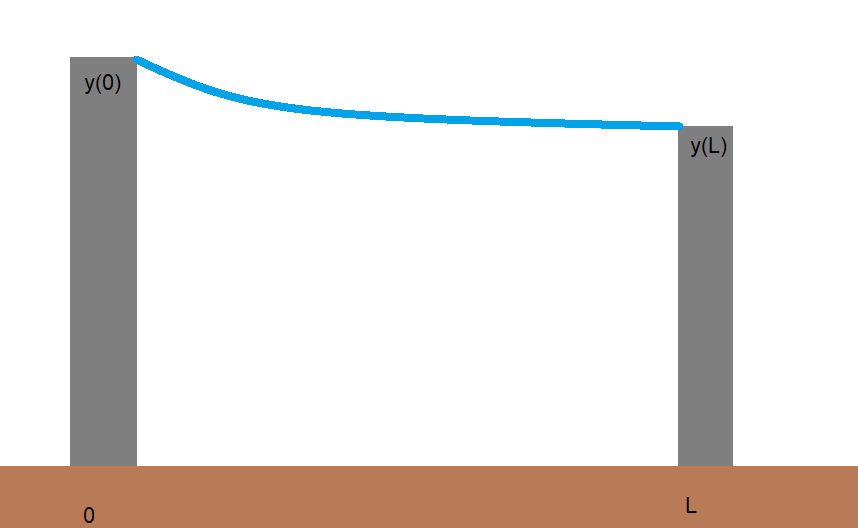

Nos preguntamos ¿cuál es la forma de la viga? Pensemos que la curva de la forma de la viga es $y(x)$. La ecuación diferencial de esta viga es:

$$\frac{d^2 y}{dx^2}  = \frac{S}{EI}y +\frac{qx}{2EI}(x-l)$$ 

donde $l$ es la lingitud de la viga, $q$ es la densidad del material por la constante de gravedad $g$, $E$ es el módulo de elasitisidad, $S$ es la fuerza por unidad de área en los extremos de la viga e $I$ es el momento de inercia de la viga. 

En este caso no hay realmente condiciones iniciales, sino condiciones de frontera. Conocemos el valor de $y(0)$ y de $y(l)$. Es decir, aunque sí tenemos cómo es la función en $y(0)$, no tenemos $y'(0)$; en cambio tenemos $y(l)$. 

## Método del disparo

Una estrategia general en la solución de problemas "nuevos", es tratar de transformarlos en un problema que ya sabemos resolver. El problema de valores a la frontera inmediatamente nos hace pensar en querer llevarlo a un problema de valores iniciales que ya sabemos resolver. 

Si la ecuación diferencial que se quiere resolver es lineal (es decir, $y$ y sus derivadas aparecen como términos lineales en la ecuación), entonces existe una única solución a la ecuación por cada par de valores a la frontera o valores iniciales. 

Supongamos que $y_1$ es la solución a un problema de valores iniciales $y_1(a) = \alpha$, $y'(a) = 0$ y $y_2$ es una solución a otro problema de valores iniciales con $y_2(a) = 0$ y $y'(a) = 1$. Entonces $y(x) = y_1(x) + \frac{\beta -y_1(b)}{y_2(b)}y_2 (x)$, es una combinación lineal de las dos soluciones, así que es también una solución a la ecuación diferencial y cumple con que $y(a) =  y_1(a) = \alpha$ y $y(b) = \beta$. 

Es decir, para resolver este problema de valores a la frontera lo único que tenemos que hacer es encontrar la solución a dos problemas de valores iniciales vía alguno de los métodos que ya conocemos y después unir esas soluciones. La única condición es que estemos resolviendo una ecuación diferencial lineal, es decir una ecuación del tipo: 

$$ y'' = p(x) y' + q(x) y + r(x). $$ 

Entonces, requeriremos la función $p(x)$, la función $q(x)$, la función $r(x)$ y los valores a la frontera $y(a) = \alpha$ y $y(b) = \beta$. 

Esta ecuación la transoformamos en el sistema de ecuaciones lineales: 

$$v' = p(x) v + q(x) y + r(x) $$

y 

$$ y' = v. $$

Este sistema de 2 ecuaciones lo resolvermos para los valores iniciales $y(a) = \alpha$ y $y'(a) = 0$ y  los valores $y(b) = 0$ y $y'(b) = 1$. 

Finalmente, con ambas soluciones, obtenemos 

$$y(x) = y_1(x) + \frac{\beta -y_1(b)}{y_2(b)}y_2 (x),$$

que es la solución a nuestro problema de valores a la frontera. 

In [14]:
include("Calculo-Algebra-EDO.jl")  #cargamos lo que ya tenemos de ecuaciones diferenciales
function solucionador_disparo(; p = x->x, q = x->x, r = x->x,a = 0, b = 1, α = 0, β = 1, n = 1000, kargs...)
    f(x, t) = [x[2], p(t)*x[2] + q(t)*x[1]+ r(t)]
    x01 = [α, 0.0]
    x02 = [0, 1.0]
    Y1 = RK4(f, x01, b-a, n; kargs...)
    Y2 = RK4(f, x02, b-a, n; kargs...)
    Y11 = [Y1[i][1] for i in 1:length(Y1)]
    Y21 = [Y2[i][1] for i in 1:length(Y2)]
    return Y11 .+ ((β - Y11[end])/Y21[end] * Y21)
end

solucionador_disparo (generic function with 1 method)

In [1]:
using Plots
S = 1.
E = 0.1
I = 1.
l = 1.
q = -1.
p(x) = 0.
qs(x) = S/(E*I)
r(x) = q*x*(x-l)/(2E*I)
Y = solucionador_disparo(p = p, q = qs, r = r, b = l, α = 0, β = 0.1, n = 1000)
X = 0:l/1000:l

LoadError: UndefVarError: `solucionador_disparo` not defined

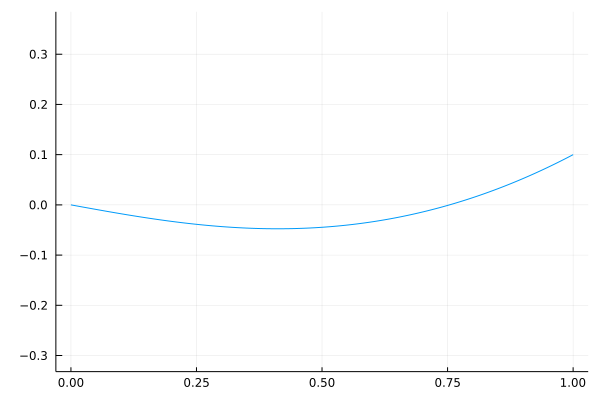

In [16]:
plot(X,Y, key = false, aspect_ratio = 1)

## Diferencias finitas

Antes de pasar a ver cómo resolver el problema de valores a la frontera en el caso no lineal, quisiera atacar el mismo problema lineal desde otro punto de vista. En vez de llevar el problema a resolver el problema de valores iniciales, llevaremos el problema a resolver un sistema de ecuaciones algebráicas lineales. 

Como hicimos antes para el problema de valores iniciales, dividiremos el eje $x$ en pequeños pedazos $\Delta x$ (diferencias finitas de $x$). 

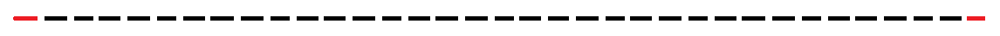

Ahora escribamos $\frac{d^2 y}{dx^2}$ en su forma diferencial, que como ejemplo tomaremos el problema de la barra: 

$$\frac{d^2 y}{dx^2} \approx \frac{y(x-\Delta x)+y(x+\Delta x)-2y(x)}{\Delta x^2} = \frac{S}{EI}y(x) +\frac{qx}{2EI}(x-l)$$

Re-escribiendo esta ecuación tenemos: 

$$  \frac{qx}{2EI}(x-l)\Delta x^2  = y(x-\Delta x)+y(x+\Delta x)-\left(2+\frac{S}{EI}\Delta x^2\right) y(x)$$

Aquí las incógnitas son $y(x-\Delta x)$, $y(x+\Delta x)$ y $y(x)$. Pero notemos que para cada $x$ (en nuestra subdivición de diferencias finitas), se obtiene una ecuación nueva. Al final, tendremos $n-1 = l/\Delta x-1$ ecuaciones, con $n+1$ incógnitas, pero dos de ellas están dadas $y(0)$ y $y(l)$, por lo que tenemos en realidad $n-1$ ecuaciones lineales con $n-1$ incógnitas y por lo tanto podemos resolver el sistema de ecuaciones invirtiendo la matriz asociada a ese sistema de ecuaciones y después multiplicando esta matriz por el vector $\vec{b}$ formado por cada $ \frac{qx}{2EI}(x-l)\Delta x^2$. 

Para que sea más claro, nombraré $y_i = y(i\Delta x)$, donde $i$ es un entero entre $0$ y $n$. Entonces cada una de las ecuaciones es: 

$$  \frac{q i \Delta x}{2EI}(i \Delta x -l)\Delta x^2  = y_{i-1}+y_{i+1}-\left(2+\frac{S}{EI}\Delta x^2\right) y_i$$

Por lo tanto: 

$$\vec{b} = [\frac{q \Delta x}{2EI}( \Delta x -l)\Delta x^2-y(0), \frac{q 2\Delta x}{2EI}(2 \Delta x -l)\Delta x^2, \dots, \frac{q (n-1) \Delta x}{2EI}((n-1) \Delta x -l)\Delta x^2 -y(l)]$$

y los elementos de la matriz son 

$$M_{i,j} = \begin{cases}
1 &\text{si $i+1 = j$ o $i-1 = j$}\\
-\left(2+\frac{S}{EI}\Delta x^2\right) &\text{si $i = j$}\\
0 &\text{en otro cas}
\end{cases}$$

La solución entonces es: 

$$y = M^{-1} \vec{b}$$

Entonces, para hacer el programa que obtenga la solución tenemos que obtener la matriz $M$, el vector $\vec{b}$ y después aplicar el operador $\backslash$ para obtener $M^{-1} \vec{b} = M\backslash \vec{b}$. 

In [17]:
function vector_b(y0, yl, n; l = 1, S = 1, E = 1, I = 1, q = -1)
    b = zeros(n-1)
    Δx = l/n
    b[1] = q*Δx*(Δx-l)*Δx^2 / (2*E*I) - y0
    b[n-1] = q*(n-1)*Δx*((n-1)*Δx-l)*Δx^2 / (2*E*I) - yl
    for i in 2:n-2 
        b[i] = i*q*Δx*(i*Δx-l)*Δx^2 / (2*E*I)
    end
    return b
end

vector_b (generic function with 1 method)

In [18]:
function matriz_M(n; l = 1, S = 1, E = 1, I = 1, q = -1)
    Δx = l/n
    M = zeros(n-1, n-1)
    for i in 1:n-1
        M[i,i] = -(2 + S*Δx^2 / (E*I))
        if i<n-1
            M[i+1,i] = 1
        end
        if i>1
            M[i-1, i] = 1
        end
    end
    return M
end 

matriz_M (generic function with 1 method)

In [19]:
function resuelve_viga(y0, yl, n; l = 1., S = 1., E = 1., I = 1., q = -1.)
    b = vector_b(y0, yl, n, l = l, S = S, E = E, I = I, q = q)
    M = matriz_M(n, l = l, S = S, E = E, I = I, q = q)
    Y = M \ b
    pushfirst!(Y, y0)
    push!(Y, yl)
    return  Y
end

resuelve_viga (generic function with 1 method)

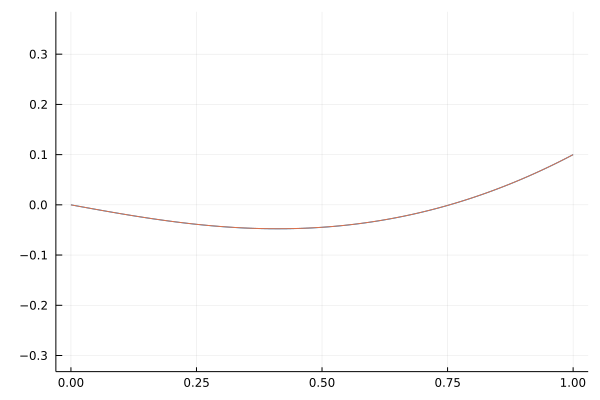

In [20]:
S = 1.
E = 0.1
I = 1.
l = 1.
q = -1.
p(x) = 0.
qs(x) = S/(E*I)
r(x) = q*x*(x-l)/(2E*I)
Y1 = solucionador_disparo(p = p, q = qs, r = r, b = l, α = 0, β = 0.1, n = 1000)
X1 = 0:l/1000:l

Y = resuelve_viga(0, 0.1, 1000, E = 0.1)
X = 0:0.001:1
plot(X,Y, key = false, aspect_ratio = 1)
plot!(X1,Y1, key = false, aspect_ratio = 1)

Hay ventajas y desventajas de este método con respecto al método de disparo. La gran desventaja está en el error que tiene el método (como ya medirán en la tarea). A cambio tiene 2 grandes ventajas: 1. La generalización a varias dimensiones (ecuaciones diferenciales parciales), es casi directa, algo que con el método de disparo no es para nada obvia. 2. La generalización a problemas no lineales es más robusta, es decir, hay menos casos donde el problema no se puede resolver. Esto lo veremos un poco más adelante. Primero centrémonos en la solución de problemas en varias dimensiones. 

##  Ecuación de Laplace

Un ejemplo típico de ecuación en derivadas parciales es la ecuaicón de Laplace $\nabla^2 f = 0$. Esta ecuación aparece en diversos problemas en física. Es por ejemplo la solución del caso estacionario de la ecuación de calor de Fourier (como veremos en la siguiente tanda de videos), otro ejemplo es la solución de problemas de electrostática. Según la ecuación de Gauss

$$ \nabla \cdot \vec{E} = \rho /\epsilon$$

Y $\vec{\nabla} V  = \vec{E}$, por lo que en ausencia de una densidad de carga se tiene: 

$$ \nabla^2 V = 0.$$

Este es el caso de por ejemplo una placa metálica inmersa en un potencial eléctrico en la frontera de la placa. En cada punto, la placa tendrá un potencial diferente. 

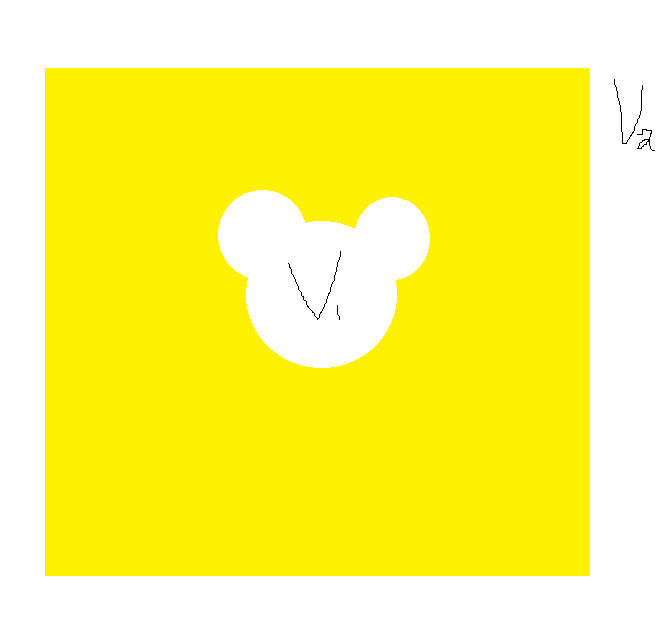

Así, tenemos las condiciones en la frontera de la placa (en el exterior y en el Mikey Mouse al interior) y queremos saber cual es el potencial en general en la placa. A este tipo de condiciones de frontera se les conoce como **condiciones de forntera de Dirichlet** y significa que lo que se da como condición en la frontera es un valor de la función. 

Nuevamente, podemos escribir la ecuación de la place (2D) en su versión de diferencias finitas: 

$$\frac{\partial^2 V(x, y)}{\partial x^2}+\frac{\partial^2 V(x, y)}{\partial y^2} = 0$$

$$ = \frac{V(x-\Delta x,y)+V(x+\Delta x,y)-2V(x,y)}{\Delta x^2} +  \frac{V(x,y-\Delta y)+V(x,y+\Delta y)-2V(x,y)}{\Delta y^2}$$

Ahora nos simplificaremos las cosas y supondremos que $\Delta x = \Delta y = \Delta$, por lo tanto: 

$$V(x-\Delta ,y)+V(x+\Delta ,y)+V(x,y-\Delta )+V(x,y+\Delta )- 4V(x,y)  = 0 $$                                                                                      
Lo que nuevamente nos da un sistema de ecuaciones lineales donde las variables ahora son $V(x,y)$, $V(x-\Delta, y)$, $V(x+\Delta, y)$, $V(x, y-\Delta)$ y $V(x, y+\Delta)$. 

Parece como que el sistema tiene la solución trivial donde todos los $V(x,y)$ son $0$, pero no, justamente por las condiciones a la frontera. Cada vez que $V(x\pm \Delta, y)$ o $V(x, y\pm \Delta)$ es parte de la frontera, la ecuación correspondiente no será homogenea. 

La dificultad está ahora básicamente en cómo escribir de forma sistemática el sistema de ecuaciones diferenciales. Por ahora vamos a resolver el cas más sencillo donde en vez de un Mikey Mouse tenemos un círculo en el centro de un cuadrado y queremos poner un potencial $V_1$ en ese círculo y un potencial $V_2$ en el exterior.

Para facilitarnos las cosas, pongamos el cuadrado centrado en el origen, es decir, y que se trate de un cuadrado de lado $L$ y un círculo centrado en el origen también de radio $R$. Entonces, $x_0 = y_0 = -L/2$,  $x_n = y_n = L/2$ y $V(x_0, y) = V(x_n, y) = V(x, y_0) = V(x, y_n) = V_2$ y $V(x,y) = V_1$ si $x^2 + y^2 \le R^2$. 

El primer paso en la solución del problema es hacer una malla, es decir, un cuadriculado de nuestra figura para asociar las correspondientes ecuaciones: 

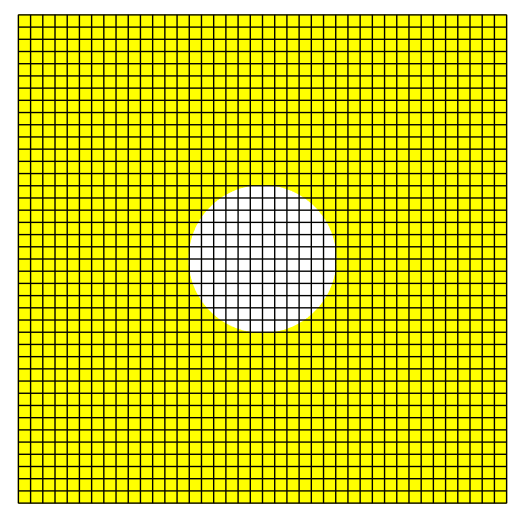

En este caso, dividimos el lado del cuadrado en $n$ pedazos de tamaño $\Delta = L/n$, de forma que se obtienen $n^2$ cajas.
Cáda vértice tendrá asociado una ecuación (y es una variable). Si es un vértice de la "frontera", su ecuación es simplemente $V(x,y) = V_{b_i}$ con $V_{b_i}$ el valor tipo $i$ del potencial en la frontera. Si no es un vértice de la frontera, entonces su ecuación es $V(x-\Delta ,y)+V(x+\Delta ,y)+V(x,y-\Delta )+V(x,y+\Delta )- 4V(x,y)  = 0 $. En este caso se deben checar tambien los cuatro valores que no son $V(x,y)$ para determinar si son o no valores de la frontera. 

El único detalle en todo esto, es que para escribir la matriz tenemos que dar un "orden" a las variables $V(x,y)$. Para esto podemos enumerar los vértices de diversas formas, por ejemplo comenzar de la esquina inferior izquierda con $V(-L/2, -L/2) = V_1$, e ir recorriendo $V(-L/2+\Delta, -L/2) = V_2,V(-L/2+2\Delta, -L/2) = V_3, \dots, V(-L/2+n\Delta, -L/2) = V_{n+1}$, después $V(-L/2, -L/2+\Delta) = V_{n+2}$, etc. hasta llegar a $V(L/2, L/2) = V_{(n+1)^2}$. 

Por lo tanto, las ecuaciones pueden ser solamente de 3 tipos:$V_i = V_{b_1}$, $V_i = V_{b_2}$ o bien $V_{i-1}+V_{i+1}+V_{i-n-1}+V_{i+n+1}- 4V_i = 0$. Para decidir qué tipo de ecuación asociamos a cada $V_i$, la información de la coordenada del vértice $(x,y)$. Si $x^2 + y^2 < R^2$ entonces $V_i = V_{b_1}$, si $x = \pm L/2$ o $y = \pm L/2$ entonces $V_i = V_{b_2}$, si no es ninguno de los dos casos, entonces $V_{i-1}+V_{i+1}+V_{i-n-1}+V_{i+n+1}- 4V_i = 0$. Con estas ecuaciones obtenemos tanto la matriz $M$ como el vector $\vec{b}$ asociado. 


### SparseArrays

Ya tenemos casi todo para hacer el algoritmo que resuelve la ecuación de Laplace en este (y otros) caso(s). De hecho, ya podríamos ir directamente ha resolver el problema, pero para ello necesitamos invertir una matriz bastante grande, en concreto, una de $(n+1)^2 \times (n+1)^2$, así que si por ejemplo, el mallado lo hacemos con $n = 100$, nuestra matriz tendrá $101^4 \sim 10^8$ elementos. Invertir y multiplicar por el vector $\vec{b}$ esto es posible, pero en general es tardado. Sin embargo, $M$ está conformada sobre todo por $0$'s, así que uno puede ahorrar memoria y tiempo de cómputo con algunos algoritmos que toman en cuenta justamente que se trata de una matriz donde casi todas las entradas son $0$'s. Invertir matrises dispersas (sparse) puede ser un problema, pero resolver la ecuación completa vía el operador $\backslash$ es muy eficiente, pues multiplica al mismo tiempo que invierte

Para poder utilizar estos algoritmos se tiene que cargar la paquetería SparseArrays que ya viene preinstalada en Julia. 

In [2]:
using SparseArrays

Ahora probemos, antes de hacer el algoritmo para resolver la ecuación de Laplace, cómo se ven los Las Matrices dispersas (sparse) y qué tan rápido opera.

In [2]:
S1 = sprandn(1000,1000,0.001)  # aquí los primeros dos números son para indicar el tamaño de la matriz,
                     # el tercer número es para indicar la densidad de dicha matri
for i in 1:1000
    S1[i,i] = rand()
end
S1

1000×1000 SparseMatrixCSC{Float64, Int64} with 2022 stored entries:
⎡⠕⢦⡠⣔⣁⠈⢆⠀⠀⠀⠜⠘⠁⡤⠀⢀⠑⠂⣀⠁⠄⠡⠀⣀⡀⡀⠀⠀⡄⡈⡀⠢⠀⠀⠄⠀⠄⡈⢀⠀⎤
⎢⠰⠨⠕⣄⠐⠰⢜⣁⠀⠀⡖⠀⠠⡀⠀⡁⠀⠀⡆⠀⡐⣀⠐⠀⠔⡒⠅⠄⠀⠀⢁⠐⠙⡀⠀⠊⠀⠐⠀⠀⎥
⎢⠰⢀⠀⢀⠑⢆⡠⠂⠐⠂⡀⠘⠂⠀⡀⠍⠌⠀⡁⠀⠀⠀⠄⠇⠈⠀⠈⠨⡈⠠⠀⡁⠋⡄⠀⠀⢘⣀⠀⠀⎥
⎢⠀⡀⠂⠐⠠⡈⠙⢤⠈⢀⠄⢀⢀⠔⠀⡀⢀⢀⠀⠌⠄⡀⠈⢄⠀⢀⢈⢂⡀⡄⠁⠐⠀⢀⣀⠡⣈⠀⠀⠐⎥
⎢⠀⠅⠄⠀⠀⠀⠐⢄⡱⣴⢂⠀⠀⠀⢀⠀⢊⠅⠀⢆⠔⠀⢀⠊⠐⢄⣀⠀⢂⠄⠈⠀⠂⠠⠂⢀⢈⠀⠊⠐⎥
⎢⠀⠀⠁⠀⠀⠀⠀⢄⠐⠅⠓⢕⠀⡦⠅⠀⠢⢂⠃⠀⡄⢈⠀⠢⠁⠀⡄⠁⠈⠒⢀⠀⠈⠠⠟⠀⠐⠒⠐⠀⎥
⎢⠀⢀⠠⠠⢀⢀⠪⠠⢐⠂⠄⠖⠑⢔⠄⢂⡀⠐⠑⠈⠜⠀⠀⡂⡈⠂⠁⠀⣀⠠⠈⠔⠀⢀⠈⠐⠡⠈⠐⠁⎥
⎢⡈⠂⠐⢀⠄⠂⠀⢀⠀⣉⠌⣂⠀⠁⠑⢔⠐⠀⠀⠅⠀⡪⢀⠁⡀⠔⠃⠑⠀⠈⠴⠅⢂⠀⠂⠀⢙⠙⠤⠂⎥
⎢⡄⢁⠄⢀⠀⠀⢐⠀⠁⠈⠀⡂⡀⠀⢂⠠⠙⣆⠐⠆⠀⠀⠙⠀⡢⡰⠀⢀⢜⠀⠠⠀⠚⠡⢀⠠⡀⠐⠀⠒⎥
⎢⠂⠁⢐⠐⠠⠀⠀⠠⠀⢠⡨⡈⠔⠀⠈⢀⠁⠀⠕⢄⠔⠈⠀⠀⠄⠈⠂⠐⠄⡨⠀⠁⢠⠭⠀⡀⢀⠀⡀⠂⎥
⎢⠠⢀⠀⢐⣰⡀⡐⠁⠀⠐⠀⠇⢐⠤⠁⢄⠀⠀⠀⠀⠗⢆⠀⠀⠀⠈⠘⢘⠙⡄⠐⣣⡀⠈⠀⠈⠰⠈⡁⠁⎥
⎢⣀⠔⠠⠀⢁⠈⠈⢤⠀⠀⠀⠔⠐⢂⢄⠌⢄⠁⠀⠐⠄⠠⠓⢄⠠⠀⢠⡀⠀⠰⢊⠠⠈⡀⠈⡀⠈⣃⢢⠀⎥
⎢⠀⡂⠀⣨⠀⠀⢀⠀⠀⠀⠠⡐⠀⠀⠁⠈⡠⠥⠠⢠⠈⢈⠨⡂⠑⢔⡁⠀⢂⢢⠀⠀⠆⢐⠀⡈⠐⠐⠄⠂⎥
⎢⠀⠄⠂⠈⣁⠀⠀⠌⡀⠍⠨⠁⡀⠀⢈⢀⠀⠂⠐⠠⠀⡄⠐⡀⠉⡀⢙⢔⠀⡀⠠⠀⠅⢄⠠⡄⢊⠁⡀⠁⎥
⎢⠠⠡⠄⠀⡀⠃⢀⠣⠀⠀⠆⠄⠈⠐⠠⠅⠘⢀⠀⠑⠀⠀⢨⠀⡀⢠⠂⠀⠓⢄⠁⠆⠁⡀⠀⠌⡘⠃⠂⠀⎥
⎢⢀⡀⢠⠂⡐⠑⢁⣈⡄⠀⠘⠂⠂⠐⠀⠄⠂⠐⡙⠈⠊⠀⠀⡁⡒⠀⣔⢄⠀⡂⠓⣄⠘⠂⡀⠐⠐⡤⠄⠀⎥
⎢⠀⠈⠀⠈⠀⠂⠐⠀⢠⡀⠰⠃⠠⠀⠀⢀⠀⠐⠆⡀⢠⠁⠐⠀⠀⠐⠀⠀⠁⢀⡤⠀⠑⢄⠀⠈⡂⠀⠅⠀⎥
⎢⡐⠀⠀⠁⠠⠢⠄⠀⠒⢄⠀⡐⠚⠂⠀⠘⠁⢄⠁⣀⡠⠀⠀⠈⠀⠀⠈⢠⠀⠂⢄⠀⠴⠀⠑⢅⢀⠀⢍⠀⎥
⎢⠌⡈⠘⠀⠔⡈⠀⠅⡀⠈⠃⠘⠂⠦⢐⠀⠄⢁⠤⠃⠀⠀⠀⡄⡔⠄⠀⠀⡀⠬⠂⠀⢐⢀⠁⠙⠑⢤⠂⠄⎥
⎣⠐⠀⠂⠩⠁⠄⠀⠀⠄⠀⠂⢠⠀⠶⢀⠀⠦⠅⡆⠀⠌⠀⠀⠀⢂⠒⠤⠃⠈⠀⠀⠀⠚⠙⠀⠔⠑⠀⠕⢄⎦

In [3]:
M1 = zeros(1000, 1000)
for i in 1:1000
    for j in 1:1000
        M1[i,j] = S1[i,j]
    end
end
M1

1000×1000 Matrix{Float64}:
 0.162792  0.0      0.0       0.0       …  0.0       0.0       0.0
 0.0       0.47809  0.0       0.0          0.0       0.0       0.0
 0.0       0.0      0.262254  0.0          0.0       0.0       0.0
 0.0       0.0      0.0       0.549901     0.0       0.0       0.0
 0.0       0.0      0.0       0.0          0.0       0.0       0.0
 0.0       0.0      0.0       0.0       …  0.0       0.0       0.0
 0.0       0.0      0.0       0.0          0.0       0.0       0.0
 0.0       0.0      0.0       0.0          0.0       0.0       0.0
 0.0       0.0      0.0       0.0          0.0       0.0       0.0
 0.0       0.0      0.0       0.0          0.0       0.0       0.0
 0.0       0.0      0.0       0.0       …  0.0       0.0       0.0
 0.0       0.0      0.0       0.0          0.0       0.0       0.0
 0.0       0.0      0.0       0.0          0.0       0.0       0.0
 ⋮                                      ⋱                      
 0.0       0.0      0.0       0.0     

In [4]:
b = rand(1000)

1000-element Vector{Float64}:
 0.8874768025333016
 0.14843905207305952
 0.5287138296260201
 0.3427551760906674
 0.5196887372746591
 0.8309138352661853
 0.5088398881602505
 0.3492108872127331
 0.7135629171266867
 0.9757249756749495
 0.672967858710311
 0.35642292428719413
 0.9173375534238396
 ⋮
 0.706188584539055
 0.5088628904431605
 0.40746787182117183
 0.03610607026931878
 0.3657933802774159
 0.8543109959001132
 0.28979529921018354
 0.4154881599414384
 0.3246369484692957
 0.6644092145484521
 0.6679571506857807
 0.529598540386386

In [5]:
@time xS = S1\b
@time x1 = M1\b

@show sum(xS-x1)

  3.421883 seconds (2.87 M allocations: 194.311 MiB, 2.66% gc time, 99.84% compilation time)
  1.274351 seconds (989.96 k allocations: 73.261 MiB, 4.59% gc time, 96.76% compilation time)
sum(xS - x1) = 1.0587080223079318e-5


1.0587080223079318e-5

Pueden ver que la diferencia entre usar matrices normales y dispersas es gigante. 

Hay otras varias funciones, nosotros vamos a usar sólo una, spzeros, que produce una matriz dispersa de $0$'s. Otra muy útil es sparse(A), que transforma a A en una matriz dispersa. 

Recuerden, esto de usar matrices dispersas sirve sobre todo para los casos donde se tienen casi puros $0$'s en la matriz. 

### Código-solución de la ecuación de Laplace

Hecho este paréntesis, pasamos a resolver la ecuación de Laplace exactamente como se mencionó arriba, pero haciendo $M$ una matriz dispersa. 

In [4]:
function solucion_Laplace_Cuadrado_Circulo(n, L, R, Vext, Vint)
    Δ = L/n
    M = spzeros((n+1)^2, (n+1)^2)
    b = zeros((n+1)^2)
    k = 1
    posicionesX = [-L/2+Δ*(i-1) for i in 1:(n+1)]
    posicionesY = [-L/2+Δ*(i-1) for i in 1:(n+1)]
    for i in 1:n+1
        for j in 1:n+1
            x = -L/2 +(i-1)*Δ  # coordenada x del mallado
            y = -L/2 +(j-1)*Δ  # coordenada y del mallado
            k = i+(n+1)*(j-1)  # indice asociado a la variable V en la coordenada (x,y).
            if x^2 + y^2 <= R^2
                M[k,k] = 1
                b[k] = Vint
            elseif i == 1 || i == n+1 || j == 1 || j == n+1
                M[k,k] = 1
                b[k] = Vext
            else
                M[k,k] = -4
                M[k, k+1] = 1
                M[k, k-1] = 1
                M[k, k+n+1] = 1
                M[k, k-n-1] = 1
            end
        end
    end
    V = M\b
    return posicionesX, posicionesY, reshape(V, n+1, n+1)
end         

solucion_Laplace_Cuadrado_Circulo (generic function with 1 method)

In [5]:
posicionesX, posicionesY, V = solucion_Laplace_Cuadrado_Circulo(100, 5, 1, 1, 5);

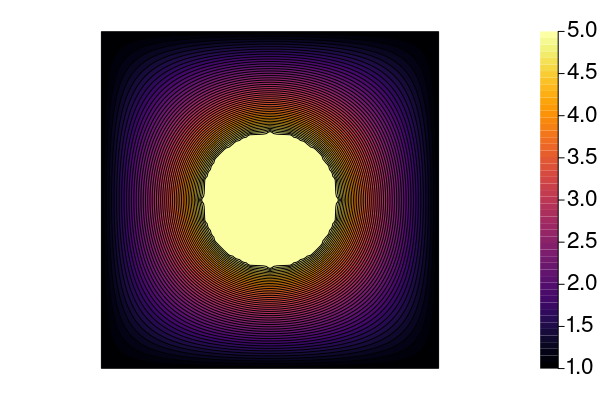

In [6]:
contour(posicionesX, posicionesY, V, aspect_ratio = 1, fill = true, levels = 50, ticks = false, axis = false)

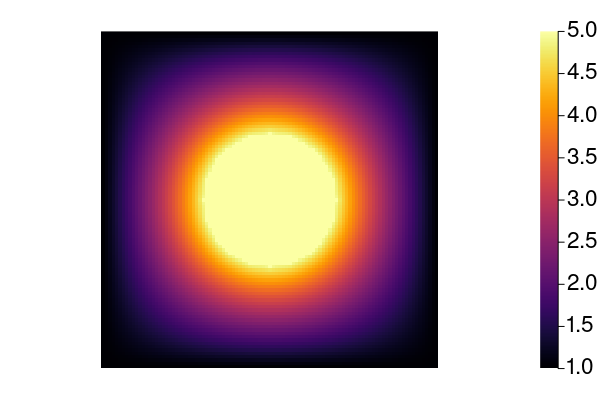

In [7]:
heatmap(posicionesX, posicionesY, V, aspect_ratio = 1, ticks = false, axis = false)

## Ecuación de difusión

Otro ejemplo famoso de ecuación en derivadas parciales que se puede resolver con este método, es la ecuación de difusión: 

$$\frac{\partial \phi}{\partial t} = D\nabla^2 \phi,$$ 

donde $D$ es una constante. 

Igual que en el caso anterior, existen condiciones a la frontera, aunque aquí puede haber de 2 tipos, condiciones de Dirichlet como ya vimos, o también **condiciones de frontera de Neumann**, que significa que lo se se tiene en la frontera no es el valor de $\phi$, sino la derivada parcial con respecto al vector normal a la frontera ( es decir el valor de $\vec{\nabla} \phi \cdot \hat{n}$ en cada punto de la frontera), por ejemplo. A veces se conoce como **condiciones reflejantes** pues en la ecuación de difusión equivale a que las partículas se reflejen en la frontera. Además existen condiciones iniciales, una sobre el valor de $\phi$ al tiempo 0. 

Escribamos entonces la ecuación de difusión en diferencias finitas: 

$$\frac{\phi(x,y;t)-\phi(x,y;t-\Delta t)}{\Delta t} = D \frac{\phi(x-\Delta x,y; t)+\phi(x+\Delta x,y;t)-2\phi(x,y;t)}{\Delta x^2} +  D\frac{\phi(x,y-\Delta y;t)+\phi(x,y+\Delta y;t)-2\phi(x,y;t)}{\Delta y^2}$$ 

Aún podemos hacer $\Delta x = \Delta y = \Delta$, pero $\Delta t$ en general tenemos que manejarlo aparte, aunque podemos $\Delta = c\Delta t$, con $c$ alguna constante, por lo que la ecuación se cambia por: 

$$\frac{\phi(x,y;t)-\phi(x,y;t-\Delta t)}{\Delta t} = D \frac{\phi(x-c\Delta t,y; t)+\phi(x+c\Delta t,y;t)-2\phi(x,y;t)}{c^2 \Delta t^2} +  D\frac{\phi(x,y-c\Delta t;t)+\phi(x,y+c\Delta t;t)-2\phi(x,y;t)}{c^2\Delta t^2}$$ 

$$ \Rightarrow  D( \phi(x-c\Delta t,y; t)+\phi(x+c\Delta t,y;t)+ \phi(x,y-c\Delta t;t)+\phi(x,y+c\Delta t;t)) - (4+c^2 \Delta t)\phi(x,y;t)+c^2 \Delta t \phi(x,y;t-\Delta t) = 0 $$. 

Nótese que podemos hacer un mallado 2D para obtener una matriz que tenga $(n+1)^2 \times (n+1)^2$ elementos, como en el caso de la ecuación de Laplace en cada paso de tiempo. También podríamos obtener una sola matriz para todos los tiempos, pero eso produce matrices en exceso grandes que suelen usar demasiada memoria. 

El valor de $\Delta t$ va a estar dado por el número de pasos de integración $N$ que querramos tener y el tiempo de la simulación, $t$, $\Delta t = t/N$. Por otro lado, si queremos que la malla tenga una separación $\Delta$ entre vértice y vértice, entonces $c = N\Delta/t$. Si $\Delta = L/n$, entonces $c = NL/nt$. 

Estudiemos por ejemplo la difusión de calor en una placa cuadrada que en el exterior está a una temperatura dada fija (en un baño térmico) e inicialmente se le pone un "cerillo" en el centro de la placa, es decir, se incrementa mucho la temperatura en una región muy pequeña en el centro. 

Ahora para poder enumerar los vértices del mallado, seguimos una estrategia similar al caso anterior, pero agregamos una variable más. 

$$D( \phi(x-c\Delta t,y; t)+\phi(x+c\Delta t,y;t)+ \phi(x,y-c\Delta t;t)+\phi(x,y+c\Delta t;t)) - (4+c^2 \Delta t)\phi(x,y;t)+c^2 \Delta t \phi(x,y;t-\Delta t) = 0 $$

In [64]:
function condicion_inicial(L, n, Tini) #pone una circular pequeña en el origen región con temperatura Tini inicialmente. 
    Δ = L/n
    VectorTini = zeros((n+1)^2)
    indice = 1
    for i in 1:n+1
        for j in 1:n+1
            x = -L/2 +(i-1)*Δ  # coordenada x del mallado
            y = -L/2 +(j-1)*Δ  # coordenada y del mallado
            indice = i+(n+1)*(j-1)  # indice asociado a la variable ϕ en la coordenada (x,y).
            if x^2 + y^2 < 0.1
                VectorTini[indice] = Tini
            end
        end
    end
    return VectorTini
end
    
function solucion_Difusión_Cuadrado_1paso(t, N, L, n, Text, VectorTini, D)
    Δt = t/N
    c = N*L/(n*t)
    Δ = c*Δt
    M = spzeros((n+1)^2, (n+1)^2)
    b = zeros((n+1)^2)
    indice = 1
    for i in 1:n+1
        for j in 1:n+1
            x = -L/2 +(i-1)*Δ  # coordenada x del mallado
            y = -L/2 +(j-1)*Δ  # coordenada y del mallado
            indice = i+(n+1)*(j-1)  # indice asociado a la variable ϕ en la coordenada (x,y).
            if i == 1 || i == n+1 || j == 1 || j == n+1
                M[indice,indice] = 1
                b[indice] = Text
            else
                M[indice,indice] = -4.0 - c^2 * Δt
                M[indice, indice+1] = D
                M[indice, indice-1] = D
                M[indice, indice+n+1] = D
                M[indice, indice-n-1] = D
                b[indice] = -c^2 * Δt*VectorTini[indice]  
            end
        end
    end
    T = M\b
    return T
end    

function solucion_Difusión_Cuadrado(t, N, L, n, Text, Tini, D)
    VectorTini = condicion_inicial(L, n, Tini)
    Ts = reshape(VectorTini, n+1, n+1)
    Δ = L/n
    posicionesX = [-L/2+Δ*(i-1) for i in 1:(n+1)]
    posicionesY = [-L/2+Δ*(i-1) for i in 1:(n+1)]
    
    @gif for i in 0:N
        if i == 0
            heatmap(posicionesX, posicionesY, Ts, aspect_ratio = 1, ticks = false, axis = false, clims = (0, 1))
            plot!(title = "t = 0", show = :ijulia)
        else
            VectorTini = solucion_Difusión_Cuadrado_1paso(t, N, L, n, Text, VectorTini, D)
            Ts = reshape(VectorTini, n+1, n+1)
            heatmap(posicionesX, posicionesY, Ts, aspect_ratio = 1, ticks = false, axis = false, clims = (0, 1), fill = true)
            plot!(title = "t = $(i*t/N)", show = :ijulia)
        end
    end
end
    

solucion_Difusión_Cuadrado (generic function with 1 method)

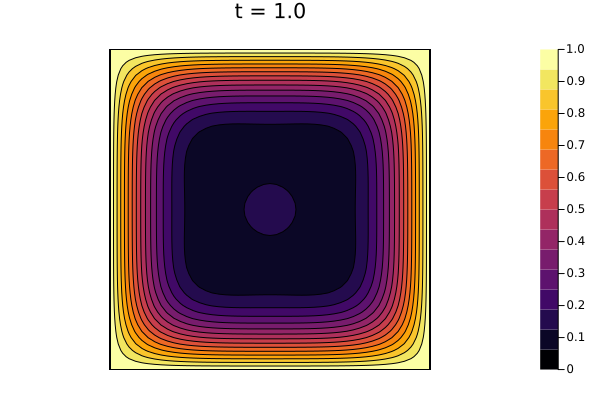

┌ Info: Saved animation to 
│   fn = D:\Cursos\Fisica-Computacional-2021-2\tmp.gif
└ @ Plots C:\Users\ata0k\.julia\packages\Plots\isZEW\src\animation.jl:104


Plots.AnimatedGif("D:\\Cursos\\Fisica-Computacional-2021-2\\tmp.gif")
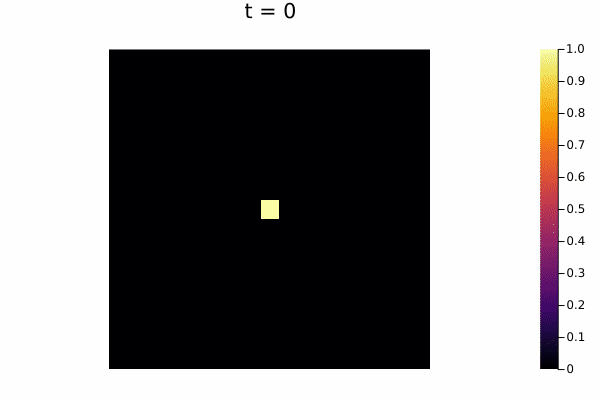

In [63]:
solucion_Difusión_Cuadrado(1, 500, 10, 50, 1, 5, 1)

## Ecuaciones no lineales

Hay varios casos donde la función que queremos encontrar o sus derivadas están expresadas en la ecuación diferencial de forma no lineal. 

El problema de valores a la frontera se puede resolver tanto por el método del disparo, como por diferencias finitas. 

### Disparo 

El método del disparo generalizado consiste no en obtener 2 soluciones y luego hacer la combinación lineal, sino en obtener una sucesión de soluciones. 

Cada solución depende de un parámetro $t_k$, donde se elige la primera solución al problema de valores iniciales $y(a) = \alpha$, $y'(a) = t_k$. Esto dará una solución que tendrá un valor $y_{t_k}(b) = f(t_k)$ en $b$. Queremos encontrar para qué $t_k$ $f(t_k)-\beta = 0$, pero esto es resolver una ecuación algebráica y la podemos resolver por ejemplo con el método de Newton. Una vez que se resuelve para qué $t_k$ se cuple esa ecuación, ya se resolvió el problema. 

### Diferencias finitas

En el caso de diferencias finitas, en realidad lo único que cambia es que el sistema de ecuaciones que se obtiene es no lineal y por lo tanto requerimos un método como el de Newton o la secante para resolverlo en vez de sólo invertir la matriz. Es decir, en el paso donde obtenemos $M\backslash b$, se tendría que resolver el sistema de ecuaciones. 


## Otros algoritmos

Existen por supuesto muchos algoritmos diferentes para optimizar la solución de ecuaciones diferenciales parciales. Algunos están enfocados a problemas muy particulares como la ecuación de onda, o la ecuación de Schödinger, otros enfocados en atender los diferentes tipos de condiciones a la frontera.  

En este sentido, los métodos de elemento finito, están enfocados en resolver eficientemente los problemas de valores a la frontera eligiendo mallados que no sean necesariamente cuadrados y que así se puedan ajustar mejor a la forma de la frontera. En este caso, la dificultad mayor suele ser el hacer correctamente el mallado, lo cual es un problema de geometría computacional (triangulaciones de Delaunay). 

Por último, existen una serie de estrategias para resolver ecuaciones diferenciales parciales utilizando ecuaciones probabilísticas. Esto será el tema de la siguiente tanda de videos. 